# Spark Config

In [0]:
spark

SparkSession - hive 
 
 
 SparkContext 

 Spark UI 

 
 Version 
 v3.2.0 
 Master 
 local[8] 
 AppName 
 Databricks Shell

In [0]:
%fs ls /FileStore/M5

path,name,size,modificationTime
dbfs:/FileStore/M5/data/,data/,0,0
dbfs:/FileStore/M5/logs/,logs/,0,0
dbfs:/FileStore/M5/models/,models/,0,0
dbfs:/FileStore/M5/processing/,processing/,0,0


In [0]:
%fs ls /FileStore/M5/data

path,name,size,modificationTime
dbfs:/FileStore/M5/data/calendar.csv,calendar.csv,103469,1640952356000
dbfs:/FileStore/M5/data/sales_train_evaluation.csv,sales_train_evaluation.csv,121736518,1640952897000
dbfs:/FileStore/M5/data/sales_train_validation.csv,sales_train_validation.csv,120007726,1640952889000
dbfs:/FileStore/M5/data/sample_submission.csv,sample_submission.csv,5228786,1640952914000
dbfs:/FileStore/M5/data/sell_prices.csv,sell_prices.csv,203395785,1640954542000


#Feature Engineering

## 1. Main Setup

In [0]:
# General imports
import numpy as np
import pandas as pd
import os, sys, gc, time, warnings, pickle, psutil, random

from math import ceil

from sklearn.preprocessing import LabelEncoder
from tqdm import tqdm

warnings.filterwarnings('ignore')

In [0]:
# Global Vars
TARGET = 'sales'         # Our main target
END_TRAIN = 1913         # Last day in train set
MAIN_INDEX = ['id','d']  # We can identify item by these columns
raw_data_dir = "dbfs:/FileStore/M5/data/"
target_Store = "CA_1"

## 2. Part 1 Basic features
- Melting train data => grid_part_1
- creating price features => grid_part_2
- creating calendar features => grid_part_3

In [0]:
# Load Data
train_df = spark.read.csv(raw_data_dir+'sales_train_validation.csv', header=True, inferSchema=True)
# prices_df = spark.read.csv(raw_data_dir+'sell_prices.csv', header=True, inferSchema=True)
# calendar_df = spark.read.csv(raw_data_dir+'calendar.csv', header=True, inferSchema=True)

In [0]:
display(train_df)

id item_id dept_id cat_id store_id state_id d_1 d_2 d_3 d_4 d_5 d_6 d_7 d_8 d_9 d_10 d_11 d_12 d_13 d_14 d_15 d_16 d_17 d_18 d_19 d_20 d_21 d_22 d_23 d_24 d_25 d_26 d_27 d_28 d_29 d_30 d_31 d_32 d_33 d_34 d_35 d_36 d_37 d_38 d_39 d_40 d_41 d_42 d_43 d_44 d_45 d_46 d_47 d_48 d_49 d_50 d_51 d_52 d_53 d_54 d_55 d_56 d_57 d_58 d_59 d_60 d_61 d_62 d_63 d_64 d_65 d_66 d_67 d_68 d_69 d_70 d_71 d_72 d_73 d_74 d_75 d_76 d_77 d_78 d_79 d_80 d_81 d_82 d_83 d_84 d_85 d_86 d_87 d_88 d_89 d_90 d_91 d_92 d_93 d_94 d_95 d_96 d_97 d_98 d_99 d_100 d_101 d_102 d_103 d_104 d_105 d_106 d_107 d_108 d_109 d_110 d_111 d_112 d_113 d_114 d_115 d_116 d_117 d_118 d_119 d_120 d_121 d_122 d_123 d_124 d_125 d_126 d_127 d_128 d_129 d_130 d_131 d_132 d_133 d_134 d_135 d_136 d_137 d_138 d_139 d_140 d_141 d_142 d_143 d_144 d_145 d_146 d_147 d_148 d_149 d_150 d_151 d_152 d_153 d_154 d_155 d_156 d_157 d_158 d_159 d_160 d_161 d_162 d_163 d_164 d_165 d_166 d_167 d_168 d_169 d_170 d_171 d_172 d_173 d_174 d_175 d_176 d_177 d_178 d_179 d_180 d_181 d_182 d_183 d_184 d_185 d_186 d_187 d_188 d_189 d_190 d_191 d_192 d_193 d_194 d_195 d_196 d_197 d_198 d_199 d_200 d_201 d_202 d_203 d_204 d_205 d_206 d_207 d_208 d_209 d_210 d_211 d_212 d_213 d_214 d_215 d_216 d_217 d_218 d_219 d_220 d_221 d_222 d_223 d_224 d_225 d_226 d_227 d_228 d_229 d_230 d_231 d_232 d_233 d_234 d_235 d_236 d_237 d_238 d_239 d_240 d_241 d_242 d_243 d_244 d_245 d_246 d_247 d_248 d_249 d_250 d_251 d_252 d_253 d_254 d_255 d_256 d_257 d_258 d_259 d_260 d_261 d_262 d_263 d_264 d_265 d_266 d_267 d_268 d_269 d_270 d_271 d_272 d_273 d_274 d_275 d_276 d_277 d_278 d_279 d_280 d_281 d_282 d_283 d_284 d_285 d_286 d_287 d_288 d_289 d_290 d_291 d_292 d_293 d_294 d_295 d_296 d_297 d_298 d_299 d_300 d_301 d_302 d_303 d_304 d_305 d_306 d_307 d_308 d_309 d_310 d_311 d_312 d_313 d_314 d_315 d_316 d_317 d_318 d_319 d_320 d_321 d_322 d_323 d_324 d_325 d_326 d_327 d_328 d_329 d_330 d_331 d_332 d_333 d_334 d_335 d_336 d_337 d_338 d_339 d_340 d_341 d_342 d_343 d_344 d_345 d_346 d_347 d_348 d_349 d_350 d_351 d_352 d_353 d_354 d_355 d_356 d_357 d_358 d_359 d_360 d_361 d_362 d_363 d_364 d_365 d_366 d_367 d_368 d_369 d_370 d_371 d_372 d_373 d_374 d_375 d_376 d_377 d_378 d_379 d_380 d_381 d_382 d_383 d_384 d_385 d_386 d_387 d_388 d_389 d_390 d_391 d_392 d_393 d_394 d_395 d_396 d_397 d_398 d_399 d_400 d_401 d_402 d_403 d_404 d_405 d_406 d_407 d_408 d_409 d_410 d_411 d_412 d_413 d_414 d_415 d_416 d_417 d_418 d_419 d_420 d_421 d_422 d_423 d_424 d_425 d_426 d_427 d_428 d_429 d_430 d_431 d_432 d_433 d_434 d_435 d_436 d_437 d_438 d_439 d_440 d_441 d_442 d_443 d_444 d_445 d_446 d_447 d_448 d_449 d_450 d_451 d_452 d_453 d_454 d_455 d_456 d_457 d_458 d_459 d_460 d_461 d_462 d_463 d_464 d_465 d_466 d_467 d_468 d_469 d_470 d_471 d_472 d_473 d_474 d_475 d_476 d_477 d_478 d_479 d_480 d_481 d_482 d_483 d_484 d_485 d_486 d_487 d_488 d_489 d_490 d_491 d_492 d_493 d_494 d_495 d_496 d_497 d_498 d_499 d_500 d_501 d_502 d_503 d_504 d_505 d_506 d_507 d_508 d_509 d_510 d_511 d_512 d_513 d_514 d_515 d_516 d_517 d_518 d_519 d_520 d_521 d_522 d_523 d_524 d_525 d_526 d_527 d_528 d_529 d_530 d_531 d_532 d_533 d_534 d_535 d_536 d_537 d_538 d_539 d_540 d_541 d_542 d_543 d_544 d_545 d_546 d_547 d_548 d_549 d_550 d_551 d_552 d_553 d_554 d_555 d_556 d_557 d_558 d_559 d_560 d_561 d_562 d_563 d_564 d_565 d_566 d_567 d_568 d_569 d_570 d_571 d_572 d_573 d_574 d_575 d_576 d_577 d_578 d_579 d_580 d_581 d_582 d_583 d_584 d_585 d_586 d_587 d_588 d_589 d_590 d_591 d_592 d_593 d_594 d_595 d_596 d_597 d_598 d_599 d_600 d_601 d_602 d_603 d_604 d_605 d_606 d_607 d_608 d_609 d_610 d_611 d_612 d_613 d_614 d_615 d_616 d_617 d_618 d_619 d_620 d_621 d_622 d_623 d_624 d_625 d_626 d_627 d_628 d_629 d_630 d_631 d_632 d_633 d_634 d_635 d_636 d_637 d_638 d_639 d_640 d_641 d_642 d_643 d_644 d_645 d_646 d_647 d_648 d_649 d_650 d_651 d_652 d_653 d_654 d_655 d_656 d_657 d_658 d_659 d_660 d_661 d_662 d_663 d_664 d_665 d_666 d_667 d_668 d_669 d_670 d_671 d_672 d_673 d_674 d_675 d_676 d_677 d_

In [0]:
import pyspark.sql.functions as F


def sparkMelt(frame, id_vars=None, value_vars=None, var_name=None, value_name=None):
    """
    Pandas melting functions implemented in Spark

    Args:
        frame (Spark DataFrame): Spark dataframe to work on.
        id_vars (list, optional): Column(s) to use as identifier variables. Defaults to None.
        value_vars (list, optional): Column(s) to unpivot. If not specified, uses all columns that are not set as id_vars. Defaults to None.
        var_name (list, optional): Name to use for the ‘variable’ column. Defaults to None. If None, use 'variable'.
        value_name (list, optional): Name to use for the ‘value’ column. Defaults to None. If None, use 'value'.

    Returns:
        [Spark DataFrame]: Unpivoted Spark DataFrame.
    """
    
    id_vars = id_vars if id_vars else frame.columns

    value_vars = [col_name for col_name in frame.columns if col_name not in id_vars] \
        if not value_vars else value_vars
    
    # if value_vars is None, no columns need to be melted
    if not value_vars:
        return frame
    
    var_name = 'variable' if not var_name else var_name
    value_name = 'value' if not value_name else value_name
    
    for col_name in value_vars:
        print(col_name)
        frame = frame.withColumn(col_name,
                                 F.struct(F.lit(col_name).alias('var_name'), F.col(col_name).alias('var_value')))
    
    frame = frame.withColumn('_zip', F.array(*value_vars)) \
        .select(*(id_vars + ['_zip'])) \
        .withColumn('_key_value', F.explode('_zip')) \
        .withColumn(var_name,  F.col('_key_value')['var_name']) \
        .withColumn(value_name,  F.col('_key_value')['var_value']) \
        .select(*(id_vars + [var_name, value_name]))

    frame = frame.select(*df_col)

    return frame

In [0]:
train_psdf = train_df.to_pandas_on_spark()

In [0]:
train_df.toPandas()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,d_11,d_12,d_13,d_14,d_15,d_16,d_17,d_18,d_19,d_20,d_21,d_22,d_23,d_24,d_25,d_26,d_27,d_28,d_29,d_30,d_31,d_32,d_33,d_34,...,d_1874,d_1875,d_1876,d_1877,d_1878,d_1879,d_1880,d_1881,d_1882,d_1883,d_1884,d_1885,d_1886,d_1887,d_1888,d_1889,d_1890,d_1891,d_1892,d_1893,d_1894,d_1895,d_1896,d_1897,d_1898,d_1899,d_1900,d_1901,d_1902,d_1903,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,1,3,1,3,1,2,2,0,1,1,1,1,0,0,0,0,0,1,0,4,2,3,0,1,2,0,0,0,1,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,2,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,3,4,2,1,4,1,3,5,0,6,6,0,0,0,0,3,1,2,1,3,1,0,2,5,4,2,0,3,0,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,3,2,2,2,3,1,0,0,0,0,1,0,4,4,0,1,4,0,1,0,1,0,1,1,2,0,1,1,2,1,1,0,1,1,2,2,2,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30485,FOODS_3_823_WI_3_validation,FOODS_3_823,FOODS_3,FOODS,WI_3,WI,0,0,2,2,0,3,1,4,1,0,0,3,4,4,0,0,1,0,1,1,7,7,3,6,3,3,7,12,4,2,7,5,12,5,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,2,0,0,0,0,0,1,0,0,1
30486,FOODS_3_824_WI_3_validation,FOODS_3_824,FOODS_3,FOODS,WI_3,WI,0,0,0,0,0,5,0,1,1,3,1,1,0,4,2,0,1,2,1,1,0,0,0,0,3,1,1,1,2,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,2,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,1,0
30487,FOODS_3_825_WI_3_validation,FOODS_3_825,FOODS_3,FOODS,WI_3,WI,0,6,0,2,2,4,1,8,5,2,7,5,3,5,20,8,10,3,3,4,7,2,3,5,6,3,4,1,2,5,1,2,2,2,...,1,1,2,0,0,2,0,0,0,2,0,1,1,0,0,0,0,1,1,2,1,4,0,0,2,2,4,0,0,0,2,1,0,2,0,1,0,0,1,0
30488,FOODS_3_826_WI_3_validation,FOODS_3_826,FOODS_3,FOODS,WI_3,WI,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,1,1,1,1,1,0,2,1,1,2,4,3,0,0,0,0,0,1,1,2,1,1,1,1,2,0,1,0,3,0,0,1,0,0,1,0,3,1,3


In [0]:
train_df.to_pandas_on_spark()

In [0]:
index_columns = ['id','item_id','dept_id','cat_id','store_id','state_id']
grid_df = pd.melt(train_df.filter(F.col("store_id") == target_Store).toPandas(), 
                  id_vars = index_columns, 
                  var_name = 'd', 
                  value_name = TARGET)

In [0]:
display(grid_df)

id,item_id,dept_id,cat_id,store_id,state_id,d,sales
HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
HOBBIES_1_006_CA_1_validation,HOBBIES_1_006,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
HOBBIES_1_007_CA_1_validation,HOBBIES_1_007,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
HOBBIES_1_008_CA_1_validation,HOBBIES_1_008,HOBBIES_1,HOBBIES,CA_1,CA,d_1,12
HOBBIES_1_009_CA_1_validation,HOBBIES_1_009,HOBBIES_1,HOBBIES,CA_1,CA,d_1,2
HOBBIES_1_010_CA_1_validation,HOBBIES_1_010,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0


In [0]:
# To be able to make predictions, we need to add "test set" to our grid
add_grid = pd.DataFrame()
for i in range(1,29):
    temp_df = train_df \
        .select(*index_columns) \
        .filter(F.col("store_id") == target_Store) \
        .toPandas()
    # temp_df = temp_df.drop_duplicates()
    temp_df['d'] = 'd_'+ str(END_TRAIN+i)
    temp_df[TARGET] = np.nan
    add_grid = pd.concat([add_grid,temp_df])

grid_df = pd.concat([grid_df,add_grid])
grid_df = grid_df.reset_index(drop=True)


In [0]:
grid_df

,id,item_id,dept_id,cat_id,store_id,state_id,d,sales
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0.0
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0.0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0.0
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0.0
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0.0
...,...,...,...,...,...,...,...,...
5918104,FOODS_3_823_CA_1_validation,FOODS_3_823,FOODS_3,FOODS,CA_1,CA,d_1941,NaN
5918105,FOODS_3_824_CA_1_validation,FOODS_3_824,FOODS_3,FOODS,CA_1,CA,d_1941,NaN
5918106,FOODS_3_825_CA_1_validation,FOODS_3_825,FOODS_3,FOODS,CA_1,CA,d_1941,NaN
5918107,FOODS_3_826_CA_1_validation,FOODS_3_826,FOODS_3,FOODS,CA_1,CA,d_1941,NaN


In [0]:
del temp_df, add_grid, train_df
gc.collect()

Out[13]: 197

In [0]:
# Let's check our memory usage
print("{:>20}: {:>8}".format('Original grid_df',sizeof_fmt(grid_df.memory_usage(index=True).sum())))

for col in index_columns:
    grid_df[col] = grid_df[col].astype('category')

print("{:>20}: {:>8}".format('Reduced grid_df',sizeof_fmt(grid_df.memory_usage(index=True).sum())))

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
<command-1569823023271466> in <module>
      1 # Let's check our memory usage
----> 2 print("{:>20}: {:>8}".format('Original grid_df',sizeof_fmt(grid_df.memory_usage(index=True).sum())))
      3 
      4 for col in index_columns:
      5     grid_df[col] = grid_df[col].astype('category')

NameError: name 'sizeof_fmt' is not defined

In [0]:
!mkdir processing
!ls

conf  eventlogs  ganglia  logs	metastore_db  preload_class.lst  processing


In [0]:
grid_df.to_pickle('processing/grid_df.pkl')

In [0]:
grid_sdf = spark.createDataFrame(grid_df)
grid_sdf.write.format("parquet").options(header='true', inferschema='true').save(raw_data_dir+'/processing/grid_df')

---------------------------------------------------------------------------
AnalysisException                         Traceback (most recent call last)
<command-2672354552875783> in <module>
      1 grid_sdf = spark.createDataFrame(grid_df)
----> 2 grid_sdf.write.format("parquet").options(header='true', inferschema='true').save(raw_data_dir+'/processing/grid_df')

/databricks/spark/python/pyspark/sql/readwriter.py in save(self, path, format, mode, partitionBy, **options)
    738             self._jwrite.save()
    739         else:
--> 740             self._jwrite.save(path)
    741 
    742     @since(1.4)

/databricks/spark/python/lib/py4j-0.10.9.1-src.zip/py4j/java_gateway.py in __call__(self, *args)
   1302 
   1303         answer = self.gateway_client.send_command(command)
-> 1304         return_value = get_return_value(
   1305             answer, self.gateway_client, self.target_id, self.name)
   1306 

/databricks/spark/python/pyspark/sql/utils.py in deco(*a, **kw)
    121     

In [0]:
!ls processing/

grid_df.pkl


### grid_part_1: Product Release date

In [0]:
grid_df = pickle.load(open('processing/grid_df.pkl', "rb"))
grid_sdf = spark.createDataFrame(grid_df)

In [0]:
prices_df = spark.read.csv(raw_data_dir+'sell_prices.csv', header=True, inferSchema=True)
prices_df = prices_df.filter(F.col("store_id") == target_Store)
prices_df

Out[89]: DataFrame[store_id: string, item_id: string, wm_yr_wk: int, sell_price: double]

In [0]:
calendar_df = spark.read.csv(raw_data_dir+'calendar.csv', header=True, inferSchema=True)
calendar_df

Out[23]: DataFrame[date: timestamp, wm_yr_wk: int, weekday: string, wday: int, month: int, year: int, d: string, event_name_1: string, event_type_1: string, event_name_2: string, event_type_2: string, snap_CA: int, snap_TX: int, snap_WI: int]

In [0]:
release_df = prices_df \
    .groupby(['store_id','item_id']) \
    .agg(F.min('wm_yr_wk').alias('release'))

In [0]:
display(release_df)

store_id,item_id,release
CA_1,HOBBIES_1_056,11305
CA_1,HOBBIES_1_152,11319
CA_1,HOUSEHOLD_1_049,11405
CA_1,HOUSEHOLD_1_198,11101
CA_1,HOUSEHOLD_2_021,11102
CA_1,HOUSEHOLD_2_157,11351
CA_1,HOUSEHOLD_2_468,11101
CA_1,FOODS_1_028,11313
CA_1,FOODS_1_146,11101
CA_1,FOODS_3_343,11101


In [0]:
# Now we can merge release_df
grid_sdf = grid_sdf.join(release_df, on = ['store_id','item_id'], how='left')
grid_sdf

Out[90]: DataFrame[store_id: string, item_id: string, id: string, dept_id: string, cat_id: string, state_id: string, d: string, sales: double, release: int]

In [0]:
# We want to remove some "zeros" rows from grid_df 
# to do it we need wm_yr_wk column let's merge partly calendar_df to have it
grid_sdf = grid_sdf.join(calendar_df.select('wm_yr_wk', 'd'), on = 'd', how='left')
grid_sdf

Out[91]: DataFrame[d: string, store_id: string, item_id: string, id: string, dept_id: string, cat_id: string, state_id: string, sales: double, release: int, wm_yr_wk: int]

In [0]:
display(grid_sdf)

d,store_id,item_id,id,dept_id,cat_id,state_id,sales,release,wm_yr_wk
d_1,CA_1,HOBBIES_1_056,HOBBIES_1_056_CA_1_validation,HOBBIES_1,HOBBIES,CA,0.0,11305,11101
d_1,CA_1,HOBBIES_1_152,HOBBIES_1_152_CA_1_validation,HOBBIES_1,HOBBIES,CA,0.0,11319,11101
d_1,CA_1,HOUSEHOLD_1_049,HOUSEHOLD_1_049_CA_1_validation,HOUSEHOLD_1,HOUSEHOLD,CA,0.0,11405,11101
d_1,CA_1,HOUSEHOLD_1_198,HOUSEHOLD_1_198_CA_1_validation,HOUSEHOLD_1,HOUSEHOLD,CA,1.0,11101,11101
d_1,CA_1,HOBBIES_2_135,HOBBIES_2_135_CA_1_validation,HOBBIES_2,HOBBIES,CA,0.0,11212,11101
d_1,CA_1,HOUSEHOLD_1_098,HOUSEHOLD_1_098_CA_1_validation,HOUSEHOLD_1,HOUSEHOLD,CA,0.0,11426,11101
d_1,CA_1,HOUSEHOLD_1_291,HOUSEHOLD_1_291_CA_1_validation,HOUSEHOLD_1,HOUSEHOLD,CA,0.0,11205,11101
d_1,CA_1,HOUSEHOLD_1_346,HOUSEHOLD_1_346_CA_1_validation,HOUSEHOLD_1,HOUSEHOLD,CA,0.0,11204,11101
d_1,CA_1,HOBBIES_1_094,HOBBIES_1_094_CA_1_validation,HOBBIES_1,HOBBIES,CA,0.0,11111,11101
d_1,CA_1,HOBBIES_1_150,HOBBIES_1_150_CA_1_validation,HOBBIES_1,HOBBIES,CA,3.0,11101,11101


In [0]:
# Now we can cutoff some rows and safe memory 
grid_sdf = grid_sdf.filter('wm_yr_wk >= release')
#     .withColumn('release', F.col('release')-F.min('release'))
# grid_sdf['release'] = grid_sdf['release'] - grid_sdf['release'].min()

In [0]:
# Save part 1
grid_sdf.write.format("csv").options(header='true', inferschema='true').save(raw_data_dir+'/processing/grid_part_1')
# grid_sdf = spark.read.format("csv").load(raw_data_dir+'/processing/grid_part_1')

In [0]:
%fs ls /FileStore/M5/data/processing/grid_part_1

path,name,size,modificationTime
dbfs:/FileStore/M5/data/processing/grid_part_1/_SUCCESS,_SUCCESS,0,1641027000000
dbfs:/FileStore/M5/data/processing/grid_part_1/_committed_6493149238785852668,_committed_6493149238785852668,736,1641026999000
dbfs:/FileStore/M5/data/processing/grid_part_1/_started_6493149238785852668,_started_6493149238785852668,0,1641026967000
dbfs:/FileStore/M5/data/processing/grid_part_1/part-00000-tid-6493149238785852668-840247c2-57ea-4090-8997-263c6101bc3c-397-1-c000.csv,part-00000-tid-6493149238785852668-840247c2-57ea-4090-8997-263c6101bc3c-397-1-c000.csv,66994710,1641026994000
dbfs:/FileStore/M5/data/processing/grid_part_1/part-00001-tid-6493149238785852668-840247c2-57ea-4090-8997-263c6101bc3c-398-1-c000.csv,part-00001-tid-6493149238785852668-840247c2-57ea-4090-8997-263c6101bc3c-398-1-c000.csv,67314280,1641026993000
dbfs:/FileStore/M5/data/processing/grid_part_1/part-00002-tid-6493149238785852668-840247c2-57ea-4090-8997-263c6101bc3c-399-1-c000.csv,part-00002-tid-6493149238785852668-840247c2-57ea-4090-8997-263c6101bc3c-399-1-c000.csv,67320662,1641026993000
dbfs:/FileStore/M5/data/processing/grid_part_1/part-00003-tid-6493149238785852668-840247c2-57ea-4090-8997-263c6101bc3c-400-1-c000.csv,part-00003-tid-6493149238785852668-840247c2-57ea-4090-8997-263c6101bc3c-400-1-c000.csv,67329135,1641026993000
dbfs:/FileStore/M5/data/processing/grid_part_1/part-00004-tid-6493149238785852668-840247c2-57ea-4090-8997-263c6101bc3c-401-1-c000.csv,part-00004-tid-6493149238785852668-840247c2-57ea-4090-8997-263c6101bc3c-401-1-c000.csv,67965377,1641026994000
dbfs:/FileStore/M5/data/processing/grid_part_1/part-00005-tid-6493149238785852668-840247c2-57ea-4090-8997-263c6101bc3c-402-1-c000.csv,part-00005-tid-6493149238785852668-840247c2-57ea-4090-8997-263c6101bc3c-402-1-c000.csv,68065503,1641026994000
dbfs:/FileStore/M5/data/processing/grid_part_1/part-00006-tid-6493149238785852668-840247c2-57ea-4090-8997-263c6101bc3c-403-1-c000.csv,part-00006-tid-6493149238785852668-840247c2-57ea-4090-8997-263c6101bc3c-403-1-c000.csv,68060696,1641026994000


### grid_part_2: Prices

In [0]:
prices_df

Out[99]: DataFrame[store_id: string, item_id: string, wm_yr_wk: int, sell_price: double]

In [0]:
# basic aggregations
@F.pandas_udf("store_id string, item_id string, wm_yr_wk int, sell_price double, price_max double, price_min double, price_std double, price_mean double, price_nunique int", F.PandasUDFType.GROUPED_MAP)  
def basic_agg(pdf):
    sell_price = pdf.sell_price
    pdf = pdf.assign(price_max=sell_price.max()) \
        .assign(price_min=sell_price.min()) \
        .assign(price_std=sell_price.std()) \
        .assign(price_mean=sell_price.mean()) \
        .assign(price_nunique=sell_price.nunique())
    return pdf
                     
prices_df = prices_df.groupby(['store_id','item_id']).apply(basic_agg)
# prices_df = prices_df.groupby(['store_id','item_id']) \
#     .apply(F.max('sell_price').alias('price_max'),
#            F.min('sell_price').alias('price_min'),
#            F.stddev('sell_price').alias('price_std'),
#            F.mean('sell_price').alias('price_mean'))

In [0]:
prices_df = prices_df.withColumn("price_norm", F.col('sell_price') / F.col('price_max'))
prices_df

Out[101]: DataFrame[store_id: string, item_id: string, wm_yr_wk: int, sell_price: double, price_max: double, price_min: double, price_std: double, price_mean: double, price_nunique: int, price_norm: double]

In [0]:
# item_nunique

@F.pandas_udf("store_id string, item_id string, wm_yr_wk int, sell_price double, price_max double, price_min double, price_std double, price_mean double, price_nunique int, price_norm double, item_nunique int", F.PandasUDFType.GROUPED_MAP)  
def item_nunique(pdf):
    item_id = pdf.item_id
    pdf = pdf.assign(item_nunique=item_id.nunique())
    return pdf

prices_df = prices_df.groupby(['store_id','item_id']).apply(item_nunique)
prices_df

Out[102]: DataFrame[store_id: string, item_id: string, wm_yr_wk: int, sell_price: double, price_max: double, price_min: double, price_std: double, price_mean: double, price_nunique: int, price_norm: double, item_nunique: int]

In [0]:
prices_df.show(10)

+--------+-----------+--------+----------+---------+---------+-------------------+-----------------+-------------+------------------+------------+
|store_id|    item_id|wm_yr_wk|sell_price|price_max|price_min|          price_std|       price_mean|price_nunique|        price_norm|item_nunique|
+--------+-----------+--------+----------+---------+---------+-------------------+-----------------+-------------+------------------+------------+
|    CA_1|FOODS_1_004|   11206|      1.78|     1.96|      1.5|0.10326095775667292|1.851377777777778|            3|0.9081632653061225|           1|
|    CA_1|FOODS_1_004|   11207|      1.78|     1.96|      1.5|0.10326095775667292|1.851377777777778|            3|0.9081632653061225|           1|
|    CA_1|FOODS_1_004|   11208|      1.78|     1.96|      1.5|0.10326095775667292|1.851377777777778|            3|0.9081632653061225|           1|
|    CA_1|FOODS_1_004|   11209|      1.78|     1.96|      1.5|0.10326095775667292|1.851377777777778|            3|0.90

In [0]:
calendar_prices = calendar_df.select('wm_yr_wk','month','year')
calendar_prices = calendar_prices.drop_duplicates(subset=['wm_yr_wk'])
prices_df = prices_df.join(calendar_prices, on='wm_yr_wk', how='left')

In [0]:
prices_df

Out[104]: DataFrame[wm_yr_wk: int, store_id: string, item_id: string, sell_price: double, price_max: double, price_min: double, price_std: double, price_mean: double, price_nunique: int, price_norm: double, item_nunique: int, month: int, year: int]

In [0]:
# Now we can add price "momentum" (some sort of)
# Shifted by week 
# by month mean
# by year mean

@F.pandas_udf("store_id string, item_id string, wm_yr_wk int, sell_price double, price_max double, price_min double, price_std double, price_mean double, price_nunique int, price_norm double, item_nunique int, price_momentum double", F.PandasUDFType.GROUPED_MAP)  
def calc_momentum(pdf):
    sell_price = pdf.sell_price
    pdf = pdf.assign(price_momentum = sell_price / sell_price.transform(lambda x: x.shift(1)))
    return pdf


# prices_df.groupby(['store_id','item_id']).apply(calc_momentum).show(10)

# prices_df['price_momentum'] = prices_df['sell_price']/prices_df.groupby(['store_id','item_id'])['sell_price'].transform(lambda x: x.shift(1))
# prices_df['price_momentum_m'] = prices_df['sell_price']/prices_df.groupby(['store_id','item_id','month'])['sell_price'].transform('mean')
# prices_df['price_momentum_y'] = prices_df['sell_price']/prices_df.groupby(['store_id','item_id','year'])['sell_price'].transform('mean')

# del prices_df['month'], prices_df['year']

In [0]:
prices_df = prices_df.toPandas()

prices_df['price_momentum'] = prices_df['sell_price']/prices_df.groupby(['store_id','item_id'])['sell_price'].transform(lambda x: x.shift(1))
prices_df['price_momentum_m'] = prices_df['sell_price']/prices_df.groupby(['store_id','item_id','month'])['sell_price'].transform('mean')
prices_df['price_momentum_y'] = prices_df['sell_price']/prices_df.groupby(['store_id','item_id','year'])['sell_price'].transform('mean')

del prices_df['month'], prices_df['year']

In [0]:
prices_df.shape

Out[107]: (698412, 14)

In [0]:
grid_sdf = spark.read.csv(raw_data_dir+'/processing/grid_part_1', header=True, inferSchema=True)

In [0]:
grid_sdf

Out[96]: DataFrame[d: string, store_id: string, item_id: string, id: string, dept_id: string, cat_id: string, state_id: string, sales: double, release: int, wm_yr_wk: int]

In [0]:
prices_df = spark.createDataFrame(prices_df)

grid_sdf = grid_sdf.select('id', 'd', 'store_id','item_id','wm_yr_wk') \
    .join(prices_df, on=['store_id','item_id','wm_yr_wk'], how='left')

In [0]:
grid_sdf.write.format("csv").options(header='true', inferschema='true').save(raw_data_dir+'/processing/grid_part_2')

In [0]:
%fs ls /FileStore/M5/data/processing/grid_part_2

path,name,size,modificationTime
dbfs:/FileStore/M5/data/processing/grid_part_2/_SUCCESS,_SUCCESS,0,1641032580000
dbfs:/FileStore/M5/data/processing/grid_part_2/_committed_8221572107760938283,_committed_8221572107760938283,825,1641032579000
dbfs:/FileStore/M5/data/processing/grid_part_2/_started_8221572107760938283,_started_8221572107760938283,0,1641032526000
dbfs:/FileStore/M5/data/processing/grid_part_2/part-00000-tid-8221572107760938283-d88dbd9a-2350-4574-b21a-eaf149100577-646-1-c000.csv,part-00000-tid-8221572107760938283-d88dbd9a-2350-4574-b21a-eaf149100577-646-1-c000.csv,97992585,1641032572000
dbfs:/FileStore/M5/data/processing/grid_part_2/part-00001-tid-8221572107760938283-d88dbd9a-2350-4574-b21a-eaf149100577-647-1-c000.csv,part-00001-tid-8221572107760938283-d88dbd9a-2350-4574-b21a-eaf149100577-647-1-c000.csv,98474075,1641032571000
dbfs:/FileStore/M5/data/processing/grid_part_2/part-00002-tid-8221572107760938283-d88dbd9a-2350-4574-b21a-eaf149100577-648-1-c000.csv,part-00002-tid-8221572107760938283-d88dbd9a-2350-4574-b21a-eaf149100577-648-1-c000.csv,98164727,1641032571000
dbfs:/FileStore/M5/data/processing/grid_part_2/part-00003-tid-8221572107760938283-d88dbd9a-2350-4574-b21a-eaf149100577-649-1-c000.csv,part-00003-tid-8221572107760938283-d88dbd9a-2350-4574-b21a-eaf149100577-649-1-c000.csv,94962400,1641032570000
dbfs:/FileStore/M5/data/processing/grid_part_2/part-00004-tid-8221572107760938283-d88dbd9a-2350-4574-b21a-eaf149100577-650-1-c000.csv,part-00004-tid-8221572107760938283-d88dbd9a-2350-4574-b21a-eaf149100577-650-1-c000.csv,94610730,1641032571000
dbfs:/FileStore/M5/data/processing/grid_part_2/part-00005-tid-8221572107760938283-d88dbd9a-2350-4574-b21a-eaf149100577-651-1-c000.csv,part-00005-tid-8221572107760938283-d88dbd9a-2350-4574-b21a-eaf149100577-651-1-c000.csv,98014049,1641032572000
dbfs:/FileStore/M5/data/processing/grid_part_2/part-00006-tid-8221572107760938283-d88dbd9a-2350-4574-b21a-eaf149100577-652-1-c000.csv,part-00006-tid-8221572107760938283-d88dbd9a-2350-4574-b21a-eaf149100577-652-1-c000.csv,94481023,1641032567000


### grid_part_3: Dates

In [0]:
# Merge calendar
grid_sdf = grid_sdf.select(MAIN_INDEX)

# Merge calendar partly
icols = ['date',
         'd',
         'event_name_1',
         'event_type_1',
         'event_name_2',
         'event_type_2',
         'snap_CA',
         'snap_TX',
         'snap_WI']
grid_sdf = grid_sdf.join(calendar_df.select(*icols), on='d', how='left')

In [0]:
grid_sdf.date

Out[112]: Column<'date'>

In [0]:
grid_sdf.show(2)

+------+--------------------+-------------------+------------+------------+------------+------------+-------+-------+-------+
|     d|                  id|               date|event_name_1|event_type_1|event_name_2|event_type_2|snap_CA|snap_TX|snap_WI|
+------+--------------------+-------------------+------------+------------+------------+------------+-------+-------+-------+
|d_1682|FOODS_3_118_CA_1_...|2015-09-06 00:00:00|        null|        null|        null|        null|      1|      1|      1|
| d_243|FOODS_3_343_CA_1_...|2011-09-28 00:00:00|        null|        null|        null|        null|      0|      0|      0|
+------+--------------------+-------------------+------------+------------+------------+------------+-------+-------+-------+
only showing top 2 rows



In [0]:
grid_sdf = grid_sdf.withColumn("tm_d", F.dayofmonth(grid_sdf.date)) \
    .withColumn("tm_w", F.weekofyear(grid_sdf.date)) \
    .withColumn("tm_m", F.month(grid_sdf.date)) \
    .withColumn("tm_y", F.year(grid_sdf.date) - 2010) \
    .withColumn("tm_dw", F.dayofweek(grid_sdf.date)) \
    .withColumn("tm_w_end", F.when(F.col("tm_dw")>=5, 1).otherwise(0))

In [0]:
grid_sdf.show(2)

+-----+--------------------+-------------------+------------+------------+------------+------------+-------+-------+-------+----+----+----+----+-----+--------+
|    d|                  id|               date|event_name_1|event_type_1|event_name_2|event_type_2|snap_CA|snap_TX|snap_WI|tm_d|tm_w|tm_m|tm_y|tm_dw|tm_w_end|
+-----+--------------------+-------------------+------------+------------+------------+------------+-------+-------+-------+----+----+----+----+-----+--------+
|d_260|FOODS_1_001_CA_1_...|2011-10-15 00:00:00|        null|        null|        null|        null|      0|      1|      1|  15|  41|  10|   1|    7|       1|
|d_261|FOODS_1_001_CA_1_...|2011-10-16 00:00:00|        null|        null|        null|        null|      0|      0|      0|  16|  41|  10|   1|    1|       0|
+-----+--------------------+-------------------+------------+------------+------------+------------+-------+-------+-------+----+----+----+----+-----+--------+
only showing top 2 rows



In [0]:
grid_sdf.write.format("csv").options(header='true', inferschema='true').save(raw_data_dir+'/processing/grid_part_3')

In [0]:
%fs ls /FileStore/M5/data/processing/grid_part_3

path,name,size,modificationTime
dbfs:/FileStore/M5/data/processing/grid_part_3/_SUCCESS,_SUCCESS,0,1641035542000
dbfs:/FileStore/M5/data/processing/grid_part_3/_committed_619780180614212244,_committed_619780180614212244,816,1641035542000
dbfs:/FileStore/M5/data/processing/grid_part_3/_started_619780180614212244,_started_619780180614212244,0,1641035498000
dbfs:/FileStore/M5/data/processing/grid_part_3/part-00000-tid-619780180614212244-1f72d32e-ac6b-4e9c-a572-9d0a4873de8b-862-1-c000.csv,part-00000-tid-619780180614212244-1f72d32e-ac6b-4e9c-a572-9d0a4873de8b-862-1-c000.csv,56188004,1641035536000
dbfs:/FileStore/M5/data/processing/grid_part_3/part-00001-tid-619780180614212244-1f72d32e-ac6b-4e9c-a572-9d0a4873de8b-863-1-c000.csv,part-00001-tid-619780180614212244-1f72d32e-ac6b-4e9c-a572-9d0a4873de8b-863-1-c000.csv,56513539,1641035536000
dbfs:/FileStore/M5/data/processing/grid_part_3/part-00002-tid-619780180614212244-1f72d32e-ac6b-4e9c-a572-9d0a4873de8b-864-1-c000.csv,part-00002-tid-619780180614212244-1f72d32e-ac6b-4e9c-a572-9d0a4873de8b-864-1-c000.csv,56349238,1641035536000
dbfs:/FileStore/M5/data/processing/grid_part_3/part-00003-tid-619780180614212244-1f72d32e-ac6b-4e9c-a572-9d0a4873de8b-865-1-c000.csv,part-00003-tid-619780180614212244-1f72d32e-ac6b-4e9c-a572-9d0a4873de8b-865-1-c000.csv,54487924,1641035534000
dbfs:/FileStore/M5/data/processing/grid_part_3/part-00004-tid-619780180614212244-1f72d32e-ac6b-4e9c-a572-9d0a4873de8b-866-1-c000.csv,part-00004-tid-619780180614212244-1f72d32e-ac6b-4e9c-a572-9d0a4873de8b-866-1-c000.csv,54291165,1641035536000
dbfs:/FileStore/M5/data/processing/grid_part_3/part-00005-tid-619780180614212244-1f72d32e-ac6b-4e9c-a572-9d0a4873de8b-867-1-c000.csv,part-00005-tid-619780180614212244-1f72d32e-ac6b-4e9c-a572-9d0a4873de8b-867-1-c000.csv,56254141,1641035537000
dbfs:/FileStore/M5/data/processing/grid_part_3/part-00006-tid-619780180614212244-1f72d32e-ac6b-4e9c-a572-9d0a4873de8b-868-1-c000.csv,part-00006-tid-619780180614212244-1f72d32e-ac6b-4e9c-a572-9d0a4873de8b-868-1-c000.csv,54199158,1641035535000


## 3. Part 2 Lag features
- Lag featrue
- Lag rolling feature

In [0]:
grid_sdf = spark.read.csv(raw_data_dir+'/processing/grid_part_1', header=True, inferSchema=True)
grid_df = grid_sdf.select('id', 'd', 'sales').toPandas()

In [0]:
grid_df.shape

Out[144]: (4788267, 3)

In [0]:
# Lags
# with 28 day shift
SHIFT_DAY = 28
LAG_DAYS = [col for col in range(SHIFT_DAY,SHIFT_DAY+15)]
grid_df = grid_df.assign(**{
        '{}_lag_{}'.format(col, l): grid_df.groupby(['id'])[col].transform(lambda x: x.shift(l))
        for l in LAG_DAYS
        for col in [TARGET]
    })

In [0]:
# Minify lag columns
for col in list(grid_df):
    if 'lag' in col:
        grid_df[col] = grid_df[col].astype(np.float16)

# Rollings
# with 28 day shift

print('Create rolling aggs')

for i in [7,14,30,60,180]:
    print('Rolling period:', i)
    grid_df['rolling_mean_'+str(i)] = grid_df \
        .groupby(['id'])[TARGET] \
        .transform(lambda x: x.shift(SHIFT_DAY).rolling(i).mean()) \
        .astype(np.float16)
    grid_df['rolling_std_'+str(i)]  = grid_df \
        .groupby(['id'])[TARGET] \
        .transform(lambda x: x.shift(SHIFT_DAY).rolling(i).std()) \
        .astype(np.float16)

# Rollings
# with sliding shift
for d_shift in [1,7,14]: 
    print('Shifting period:', d_shift)
    for d_window in [7,14,30,60]:
        col_name = 'rolling_mean_tmp_'+str(d_shift)+'_'+str(d_window)
        grid_df[col_name] = grid_df \
            .groupby(['id'])[TARGET] \
            .transform(lambda x: x.shift(d_shift).rolling(d_window).mean()) \
            .astype(np.float16)


Create rolling aggs
Rolling period: 7
Rolling period: 14
Rolling period: 30
Rolling period: 60
Rolling period: 180
Shifting period: 1
Shifting period: 7
Shifting period: 14


In [0]:
grid_sdf = spark.createDataFrame(grid_df)

In [0]:
grid_sdf

Out[8]: DataFrame[id: string, d: string, sales: double, sales_lag_28: double, sales_lag_29: double, sales_lag_30: double, sales_lag_31: double, sales_lag_32: double, sales_lag_33: double, sales_lag_34: double, sales_lag_35: double, sales_lag_36: double, sales_lag_37: double, sales_lag_38: double, sales_lag_39: double, sales_lag_40: double, sales_lag_41: double, sales_lag_42: double, rolling_mean_7: double, rolling_std_7: double, rolling_mean_14: double, rolling_std_14: double, rolling_mean_30: double, rolling_std_30: double, rolling_mean_60: double, rolling_std_60: double, rolling_mean_180: double, rolling_std_180: double, rolling_mean_tmp_1_7: double, rolling_mean_tmp_1_14: double, rolling_mean_tmp_1_30: double, rolling_mean_tmp_1_60: double, rolling_mean_tmp_7_7: double, rolling_mean_tmp_7_14: double, rolling_mean_tmp_7_30: double, rolling_mean_tmp_7_60: double, rolling_mean_tmp_14_7: double, rolling_mean_tmp_14_14: double, rolling_mean_tmp_14_30: double, rolling_mean_tmp_14_60: doub

In [0]:
# Save lags and rollings
grid_sdf.write.format("csv").options(header='true', inferschema='true').save(raw_data_dir+'/processing/lags_df_28')

## 4. Part 3 Mean encoding feature

In [0]:
grid_sdf = spark.read.csv(raw_data_dir+'/processing/grid_part_1', header=True, inferSchema=True)

In [0]:
grid_sdf = spark.read.csv(raw_data_dir+'/processing/grid_part_1', header=True, inferSchema=True)
grid_df = grid_sdf.toPandas()
grid_df

,d,store_id,item_id,id,dept_id,cat_id,state_id,sales,release,wm_yr_wk
0,d_971,CA_1,HOUSEHOLD_2_468,HOUSEHOLD_2_468_CA_1_validation,HOUSEHOLD_2,HOUSEHOLD,CA,0.0,11101,11335
1,d_971,CA_1,FOODS_1_028,FOODS_1_028_CA_1_validation,FOODS_1,FOODS,CA,0.0,11313,11335
2,d_971,CA_1,FOODS_1_146,FOODS_1_146_CA_1_validation,FOODS_1,FOODS,CA,0.0,11101,11335
3,d_971,CA_1,FOODS_3_343,FOODS_3_343_CA_1_validation,FOODS_3,FOODS,CA,0.0,11101,11335
4,d_971,CA_1,FOODS_3_411,FOODS_3_411_CA_1_validation,FOODS_3,FOODS,CA,0.0,11101,11335
...,...,...,...,...,...,...,...,...,...,...
4788262,d_1213,CA_1,FOODS_3_658,FOODS_3_658_CA_1_validation,FOODS_3,FOODS,CA,3.0,11315,11417
4788263,d_1213,CA_1,FOODS_3_749,FOODS_3_749_CA_1_validation,FOODS_3,FOODS,CA,0.0,11101,11417
4788264,d_1214,CA_1,HOBBIES_1_055,HOBBIES_1_055_CA_1_validation,HOBBIES_1,HOBBIES,CA,1.0,11101,11417
4788265,d_1214,CA_1,HOBBIES_1_156,HOBBIES_1_156_CA_1_validation,HOBBIES_1,HOBBIES,CA,0.0,11412,11417


In [0]:
base_cols = grid_sdf.columns
icols =  [
            ['state_id'],
            ['store_id'],
            ['cat_id'],
            ['dept_id'],
            ['state_id', 'cat_id'],
            ['state_id', 'dept_id'],
            ['store_id', 'cat_id'],
            ['store_id', 'dept_id'],
            ['item_id'],
            ['item_id', 'state_id'],
            ['item_id', 'store_id']
            ]
for col in icols:
    print('Encoding', col)
    col_name = '_'+'_'.join(col)+'_'
    temp_df = grid_sdf.groupby(col) \
        .agg(F.mean('sales').alias('enc'+col_name+'mean'),
             F.stddev('sales').alias('enc'+col_name+'std'))
    grid_sdf = grid_sdf.join(temp_df, on=col, how="left")

keep_cols = [col for col in grid_sdf.columns if col not in base_cols]
grid_sdf = grid_sdf.select(*(['id', 'd']+keep_cols))

Encoding ['state_id']
Encoding ['store_id']
Encoding ['cat_id']
Encoding ['dept_id']
Encoding ['state_id', 'cat_id']
Encoding ['state_id', 'dept_id']
Encoding ['store_id', 'cat_id']
Encoding ['store_id', 'dept_id']
Encoding ['item_id']
Encoding ['item_id', 'state_id']
Encoding ['item_id', 'store_id']


In [0]:
display(grid_sdf)

id,d,enc_state_id_mean,enc_state_id_std,enc_store_id_mean,enc_store_id_std,enc_cat_id_mean,enc_cat_id_std,enc_dept_id_mean,enc_dept_id_std,enc_state_id_cat_id_mean,enc_state_id_cat_id_std,enc_state_id_dept_id_mean,enc_state_id_dept_id_std,enc_store_id_cat_id_mean,enc_store_id_cat_id_std,enc_store_id_dept_id_mean,enc_store_id_dept_id_std,enc_item_id_mean,enc_item_id_std,enc_item_id_state_id_mean,enc_item_id_state_id_std,enc_item_id_store_id_mean,enc_item_id_store_id_std
FOODS_3_343_CA_1_validation,d_971,1.6369100309490219,4.4621833779379765,1.6369100309490219,4.4621833779379765,2.423790937407799,5.902435918843931,3.124426276192431,7.24035331691829,2.423790937407799,5.902435918843875,3.124426276192431,7.240353316918211,2.423790937407799,5.902435918843931,3.124426276192431,7.24035331691829,0.2854155776267642,0.6876689958196487,0.2854155776267642,0.687668995819649,0.2854155776267642,0.6876689958196487
FOODS_3_343_CA_1_validation,d_972,1.6369100309490219,4.4621833779379765,1.6369100309490219,4.4621833779379765,2.423790937407799,5.902435918843931,3.124426276192431,7.24035331691829,2.423790937407799,5.902435918843875,3.124426276192431,7.240353316918211,2.423790937407799,5.902435918843931,3.124426276192431,7.24035331691829,0.2854155776267642,0.6876689958196487,0.2854155776267642,0.687668995819649,0.2854155776267642,0.6876689958196487
FOODS_3_343_CA_1_validation,d_973,1.6369100309490219,4.4621833779379765,1.6369100309490219,4.4621833779379765,2.423790937407799,5.902435918843931,3.124426276192431,7.24035331691829,2.423790937407799,5.902435918843875,3.124426276192431,7.240353316918211,2.423790937407799,5.902435918843931,3.124426276192431,7.24035331691829,0.2854155776267642,0.6876689958196487,0.2854155776267642,0.687668995819649,0.2854155776267642,0.6876689958196487
FOODS_3_343_CA_1_validation,d_974,1.6369100309490219,4.4621833779379765,1.6369100309490219,4.4621833779379765,2.423790937407799,5.902435918843931,3.124426276192431,7.24035331691829,2.423790937407799,5.902435918843875,3.124426276192431,7.240353316918211,2.423790937407799,5.902435918843931,3.124426276192431,7.24035331691829,0.2854155776267642,0.6876689958196487,0.2854155776267642,0.687668995819649,0.2854155776267642,0.6876689958196487
FOODS_3_343_CA_1_validation,d_975,1.6369100309490219,4.4621833779379765,1.6369100309490219,4.4621833779379765,2.423790937407799,5.902435918843931,3.124426276192431,7.24035331691829,2.423790937407799,5.902435918843875,3.124426276192431,7.240353316918211,2.423790937407799,5.902435918843931,3.124426276192431,7.24035331691829,0.2854155776267642,0.6876689958196487,0.2854155776267642,0.687668995819649,0.2854155776267642,0.6876689958196487
FOODS_3_343_CA_1_validation,d_976,1.6369100309490219,4.4621833779379765,1.6369100309490219,4.4621833779379765,2.423790937407799,5.902435918843931,3.124426276192431,7.24035331691829,2.423790937407799,5.902435918843875,3.124426276192431,7.240353316918211,2.423790937407799,5.902435918843931,3.124426276192431,7.24035331691829,0.2854155776267642,0.6876689958196487,0.2854155776267642,0.687668995819649,0.2854155776267642,0.6876689958196487
FOODS_3_343_CA_1_validation,d_977,1.6369100309490219,4.4621833779379765,1.6369100309490219,4.4621833779379765,2.423790937407799,5.902435918843931,3.124426276192431,7.24035331691829,2.423790937407799,5.902435918843875,3.124426276192431,7.240353316918211,2.423790937407799,5.902435918843931,3.124426276192431,7.24035331691829,0.2854155776267642,0.6876689958196487,0.2854155776267642,0.687668995819649,0.2854155776267642,0.6876689958196487
FOODS_3_343_CA_1_validation,d_978,1.6369100309490219,4.4621833779379765,1.6369100309490219,4.4621833779379765,2.423790937407799,5.902435918843931,3.124426276192431,7.24035331691829,2.423790937407799,5.902435918843875,3.124426276192431,7.240353316918211,2.423790937407799,5.902435918843931,3.124426276192431,7.24035331691829,0.2854155776267642,0.6876689958196487,0.2854155776267642,0.687668995819649,0.2854155776267642,0.6876689958196487
FOODS_3_343_CA_1_validation,d_

In [0]:
grid_df['sales'][grid_df['d'].map(lambda x: x.replace("d_", "")).astype(np.int) >(1941-28)] = np.nan
base_cols = list(grid_df)

icols =  [
            ['state_id'],
            ['store_id'],
            ['cat_id'],
            ['dept_id'],
            ['state_id', 'cat_id'],
            ['state_id', 'dept_id'],
            ['store_id', 'cat_id'],
            ['store_id', 'dept_id'],
            ['item_id'],
            ['item_id', 'state_id'],
            ['item_id', 'store_id']
            ]

for col in icols:
    print('Encoding', col)
    col_name = '_'+'_'.join(col)+'_'
    grid_df['enc'+col_name+'mean'] = grid_df.groupby(col)['sales'].transform('mean').astype(np.float16)
    grid_df['enc'+col_name+'std'] = grid_df.groupby(col)['sales'].transform('std').astype(np.float16)

keep_cols = [col for col in list(grid_df) if col not in base_cols]
grid_df = grid_df[['id','d']+keep_cols]

Encoding ['state_id']
Encoding ['store_id']
Encoding ['cat_id']
Encoding ['dept_id']
Encoding ['state_id', 'cat_id']
Encoding ['state_id', 'dept_id']
Encoding ['store_id', 'cat_id']
Encoding ['store_id', 'dept_id']
Encoding ['item_id']
Encoding ['item_id', 'state_id']
Encoding ['item_id', 'store_id']


In [0]:
grid_df

,id,d,enc_state_id_mean,enc_state_id_std,enc_store_id_mean,enc_store_id_std,enc_cat_id_mean,enc_cat_id_std,enc_dept_id_mean,enc_dept_id_std,enc_state_id_cat_id_mean,enc_state_id_cat_id_std,enc_state_id_dept_id_mean,enc_state_id_dept_id_std,enc_store_id_cat_id_mean,enc_store_id_cat_id_std,enc_store_id_dept_id_mean,enc_store_id_dept_id_std,enc_item_id_mean,enc_item_id_std,enc_item_id_state_id_mean,enc_item_id_state_id_std,enc_item_id_store_id_mean,enc_item_id_store_id_std
0,HOUSEHOLD_2_468_CA_1_validation,d_971,1.636719,4.460938,1.636719,4.460938,0.895020,1.793945,0.413818,0.851074,0.895020,1.793945,0.413818,0.851074,0.895020,1.793945,0.413818,0.851074,0.296387,0.570801,0.296387,0.570801,0.296387,0.570801
1,FOODS_1_028_CA_1_validation,d_971,1.636719,4.460938,1.636719,4.460938,2.423828,5.902344,1.613281,3.224609,2.423828,5.902344,1.613281,3.224609,2.423828,5.902344,1.613281,3.224609,1.056641,2.033203,1.056641,2.033203,1.056641,2.033203
2,FOODS_1_146_CA_1_validation,d_971,1.636719,4.460938,1.636719,4.460938,2.423828,5.902344,1.613281,3.224609,2.423828,5.902344,1.613281,3.224609,2.423828,5.902344,1.613281,3.224609,0.812988,1.216797,0.812988,1.216797,0.812988,1.216797
3,FOODS_3_343_CA_1_validation,d_971,1.636719,4.460938,1.636719,4.460938,2.423828,5.902344,3.125000,7.242188,2.423828,5.902344,3.125000,7.242188,2.423828,5.902344,3.125000,7.242188,0.285400,0.687500,0.285400,0.687500,0.285400,0.687500
4,FOODS_3_411_CA_1_validation,d_971,1.636719,4.460938,1.636719,4.460938,2.423828,5.902344,3.125000,7.242188,2.423828,5.902344,3.125000,7.242188,2.423828,5.902344,3.125000,7.242188,1.383789,1.605469,1.383789,1.605469,1.383789,1.605469
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4788262,FOODS_3_658_CA_1_validation,d_1213,1.636719,4.460938,1.636719,4.460938,2.423828,5.902344,3.125000,7.242188,2.423828,5.902344,3.125000,7.242188,2.423828,5.902344,3.125000,7.242188,0.820801,1.120117,0.820801,1.120117,0.820801,1.120117
4788263,FOODS_3_749_CA_1_validation,d_1213,1.636719,4.460938,1.636719,4.460938,2.423828,5.902344,3.125000,7.242188,2.423828,5.902344,3.125000,7.242188,2.423828,5.902344,3.125000,7.242188,0.718262,1.781250,0.718262,1.781250,0.718262,1.781250
4788264,HOBBIES_1_055_CA_1_validation,d_1214,1.636719,4.460938,1.636719,4.460938,1.003906,3.121094,1.260742,3.541016,1.003906,3.121094,1.260742,3.541016,1.003906,3.121094,1.260742,3.541016,1.674805,1.741211,1.674805,1.741211,1.674805,1.741211
4788265,HOBBIES_1_156_CA_1_validation,d_1214,1.636719,4.460938,1.636719,4.460938,1.003906,3.121094,1.260742,3.541016,1.003906,3.121094,1.260742,3.541016,1.003906,3.121094,1.260742,3.541016,0.740723,1.385742,0.740723,1.385742,0.740723,1.385742


In [0]:
# Save Mean/Std encoding
# grid_sdf = spark.createDataFrame(grid_df)
grid_sdf.write.format("csv").options(header='true', inferschema='true').save(raw_data_dir+'/processing/mean_encoding_df')

In [0]:
%fs ls /FileStore/M5/data/processing/mean_encoding_df

path,name,size,modificationTime
dbfs:/FileStore/M5/data/processing/mean_encoding_df/_SUCCESS,_SUCCESS,0,1641109875000
dbfs:/FileStore/M5/data/processing/mean_encoding_df/_committed_6424881361601460286,_committed_6424881361601460286,647,1641109874000
dbfs:/FileStore/M5/data/processing/mean_encoding_df/_started_6424881361601460286,_started_6424881361601460286,0,1641109737000
dbfs:/FileStore/M5/data/processing/mean_encoding_df/part-00000-tid-6424881361601460286-b193fd5e-33b0-42d8-81dd-acc7cc831457-647-1-c000.csv,part-00000-tid-6424881361601460286-b193fd5e-33b0-42d8-81dd-acc7cc831457-647-1-c000.csv,103625946,1641109779000
dbfs:/FileStore/M5/data/processing/mean_encoding_df/part-00001-tid-6424881361601460286-b193fd5e-33b0-42d8-81dd-acc7cc831457-648-1-c000.csv,part-00001-tid-6424881361601460286-b193fd5e-33b0-42d8-81dd-acc7cc831457-648-1-c000.csv,380742343,1641109849000
dbfs:/FileStore/M5/data/processing/mean_encoding_df/part-00002-tid-6424881361601460286-b193fd5e-33b0-42d8-81dd-acc7cc831457-649-1-c000.csv,part-00002-tid-6424881361601460286-b193fd5e-33b0-42d8-81dd-acc7cc831457-649-1-c000.csv,363243828,1641109847000
dbfs:/FileStore/M5/data/processing/mean_encoding_df/part-00003-tid-6424881361601460286-b193fd5e-33b0-42d8-81dd-acc7cc831457-650-1-c000.csv,part-00003-tid-6424881361601460286-b193fd5e-33b0-42d8-81dd-acc7cc831457-650-1-c000.csv,300847237,1641109836000
dbfs:/FileStore/M5/data/processing/mean_encoding_df/part-00004-tid-6424881361601460286-b193fd5e-33b0-42d8-81dd-acc7cc831457-651-1-c000.csv,part-00004-tid-6424881361601460286-b193fd5e-33b0-42d8-81dd-acc7cc831457-651-1-c000.csv,158576703,1641109801000
dbfs:/FileStore/M5/data/processing/mean_encoding_df/part-00005-tid-6424881361601460286-b193fd5e-33b0-42d8-81dd-acc7cc831457-652-1-c000.csv,part-00005-tid-6424881361601460286-b193fd5e-33b0-42d8-81dd-acc7cc831457-652-1-c000.csv,558546067,1641109866000
dbfs:/FileStore/M5/data/processing/mean_encoding_df/part-00006-tid-6424881361601460286-b193fd5e-33b0-42d8-81dd-acc7cc831457-653-1-c000.csv,part-00006-tid-6424881361601460286-b193fd5e-33b0-42d8-81dd-acc7cc831457-653-1-c000.csv,277030618,1641109832000


# Train

## Data processing

In [0]:
grid1_colunm = ["id", "d", "item_id", "dept_id", "cat_id", "sales", "release"]

grid2_colunm = ["id", "d", 'sell_price', 'price_max', 'price_min', 'price_std',
               'price_mean', 'price_norm', 'price_nunique', 'item_nunique',
               'price_momentum', 'price_momentum_m', 'price_momentum_y']

grid3_colunm = ["id", "d", 'event_name_1', 'event_type_1', 'event_name_2',
               'event_type_2', 'snap_CA', 'snap_TX', 'snap_WI', 'tm_d', 'tm_w', 'tm_m',
               'tm_y', 'tm_dw', 'tm_w_end']

lag_colunm = ["id", "d", 'sales_lag_28', 'sales_lag_29', 'sales_lag_30',
             'sales_lag_31', 'sales_lag_32', 'sales_lag_33', 'sales_lag_34',
             'sales_lag_35', 'sales_lag_36', 'sales_lag_37', 'sales_lag_38',
             'sales_lag_39', 'sales_lag_40', 'sales_lag_41', 'sales_lag_42',
             
             'rolling_mean_7', 'rolling_std_7', 'rolling_mean_14', 'rolling_std_14',
             'rolling_mean_30', 'rolling_std_30', 'rolling_mean_60',
             'rolling_std_60', 'rolling_mean_180', 'rolling_std_180']

mean_enc_colunm = ["id", "d", 
    'enc_store_id_dept_id_mean', 'enc_store_id_dept_id_std', 
    'enc_item_id_state_id_mean', 'enc_item_id_state_id_std',
]

FIRST_DAY = 710

In [0]:
grid_df = spark.read.csv(raw_data_dir+'/processing/grid_part_1', header=True, inferSchema=True).select(*grid1_colunm)

@F.pandas_udf("int")
def extract_d(s: pd.Series) -> pd.Series:
    return s.map(lambda x: int(x.replace("d_", "")))

grid_df = grid_df.withColumn("d_int", extract_d("d")).filter(F.col("d_int") > FIRST_DAY).drop("d_int")

In [0]:
# grid_df = grid_df.withColumn("d_int", extract_d("d")).filter(F.col("d_int") < 1000).drop("d_int")

In [0]:
temp_df = spark.read.csv(raw_data_dir+'/processing/grid_part_2', header=True, inferSchema=True).select(*grid2_colunm)
grid_df = grid_df.join(temp_df, on = MAIN_INDEX, how = "left")
temp_df = spark.read.csv(raw_data_dir+'/processing/grid_part_3', header=True, inferSchema=True).select(*grid3_colunm)
grid_df = grid_df.join(temp_df, on = MAIN_INDEX, how = "left")
temp_df = spark.read.csv(raw_data_dir+'/processing/lags_df_28', header=True, inferSchema=True).select(*lag_colunm)
grid_df = grid_df.join(temp_df, on = MAIN_INDEX, how = "left")
temp_df = spark.read.csv(raw_data_dir+'/processing/mean_encoding_df', header=True, inferSchema=True).select(*mean_enc_colunm)
grid_df = grid_df.join(temp_df, on = MAIN_INDEX, how = "left")

In [0]:
grid_df

Out[40]: DataFrame[id: string, d: string, item_id: string, dept_id: string, cat_id: string, sales: double, release: int, sell_price: double, price_max: double, price_min: double, price_std: double, price_mean: double, price_norm: double, price_nunique: int, item_nunique: int, price_momentum: double, price_momentum_m: double, price_momentum_y: double, event_name_1: string, event_type_1: string, event_name_2: string, event_type_2: string, snap_CA: int, snap_TX: int, snap_WI: int, tm_d: int, tm_w: int, tm_m: int, tm_y: int, tm_dw: int, tm_w_end: int, sales_lag_28: double, sales_lag_29: double, sales_lag_30: double, sales_lag_31: double, sales_lag_32: double, sales_lag_33: double, sales_lag_34: double, sales_lag_35: double, sales_lag_36: double, sales_lag_37: double, sales_lag_38: double, sales_lag_39: double, sales_lag_40: double, sales_lag_41: double, sales_lag_42: double, rolling_mean_7: double, rolling_std_7: double, rolling_mean_14: double, rolling_std_14: double, rolling_mean_30: dou

In [0]:
grid_df.show(1)

+--------------------+------+-----------+-------+------+-----+-------+----------+---------+---------+-------------------+------------------+----------+-------------+------------+--------------+-----------------+------------------+------------+------------+------------+------------+-------+-------+-------+----+----+----+----+-----+--------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+------------+--------------+--------------+---------------+--------------+---------------+--------------+---------------+--------------+----------------+---------------+-------------------------+------------------------+-------------------------+------------------------+
|                  id|     d|    item_id|dept_id|cat_id|sales|release|sell_price|price_max|price_min|          price_std|        price_mean|price_norm|price_nunique|item_nunique|price_momentum| price_momen

In [0]:
grid_df.count()

Out[42]: 3473864

In [0]:
 grid_df = grid_df.drop("id") # .drop("d")

In [0]:
grid_df = grid_df.na.fill(subset=["event_name_1", "event_type_1", "event_name_2", "event_type_2"], value='NA')

In [0]:
grid_df = grid_df.dropna()

In [0]:
grid_df

Out[41]: DataFrame[d: string, item_id: string, dept_id: string, cat_id: string, sales: double, release: int, sell_price: double, price_max: double, price_min: double, price_std: double, price_mean: double, price_norm: double, price_nunique: int, item_nunique: int, price_momentum: double, price_momentum_m: double, price_momentum_y: double, event_name_1: string, event_type_1: string, event_name_2: string, event_type_2: string, snap_CA: int, snap_TX: int, snap_WI: int, tm_d: int, tm_w: int, tm_m: int, tm_y: int, tm_dw: int, tm_w_end: int, sales_lag_28: double, sales_lag_29: double, sales_lag_30: double, sales_lag_31: double, sales_lag_32: double, sales_lag_33: double, sales_lag_34: double, sales_lag_35: double, sales_lag_36: double, sales_lag_37: double, sales_lag_38: double, sales_lag_39: double, sales_lag_40: double, sales_lag_41: double, sales_lag_42: double, rolling_mean_7: double, rolling_std_7: double, rolling_mean_14: double, rolling_std_14: double, rolling_mean_30: double, rolling

In [0]:
features_col = [col for col in grid_df.columns if col not in ['sales', 'd']]
features_col

Out[42]: ['item_id',
 'dept_id',
 'cat_id',
 'release',
 'sell_price',
 'price_max',
 'price_min',
 'price_std',
 'price_mean',
 'price_norm',
 'price_nunique',
 'item_nunique',
 'price_momentum',
 'price_momentum_m',
 'price_momentum_y',
 'event_name_1',
 'event_type_1',
 'event_name_2',
 'event_type_2',
 'snap_CA',
 'snap_TX',
 'snap_WI',
 'tm_d',
 'tm_w',
 'tm_m',
 'tm_y',
 'tm_dw',
 'tm_w_end',
 'sales_lag_28',
 'sales_lag_29',
 'sales_lag_30',
 'sales_lag_31',
 'sales_lag_32',
 'sales_lag_33',
 'sales_lag_34',
 'sales_lag_35',
 'sales_lag_36',
 'sales_lag_37',
 'sales_lag_38',
 'sales_lag_39',
 'sales_lag_40',
 'sales_lag_41',
 'sales_lag_42',
 'rolling_mean_7',
 'rolling_std_7',
 'rolling_mean_14',
 'rolling_std_14',
 'rolling_mean_30',
 'rolling_std_30',
 'rolling_mean_60',
 'rolling_std_60',
 'rolling_mean_180',
 'rolling_std_180',
 'enc_store_id_dept_id_mean',
 'enc_store_id_dept_id_std',
 'enc_item_id_state_id_mean',
 'enc_item_id_state_id_std']

In [0]:
from pyspark.ml.feature import VectorAssembler, OneHotEncoder, StringIndexer
from pyspark.ml import Pipeline
# assembler = VectorAssembler(
#         inputCols=features_col,
#         outputCol="features"
# )
stages = list()
categoricalColumns = ["item_id", "dept_id", "cat_id", "event_name_1", "event_type_1", "event_name_2", "event_type_2"]
for cate in categoricalColumns:
    indexer = StringIndexer().setInputCol(cate).setOutputCol(f"{cate}_Index")
    encoder = OneHotEncoder().setInputCol(indexer.getOutputCol()).setOutputCol(f"{cate}_classVec")
    stages.append(indexer)
    stages.append(encoder)

numericCols = [col for col in features_col if col not in categoricalColumns]
assemblerInputs = [col + "_classVec" for col in categoricalColumns] + numericCols
assembler = VectorAssembler().setInputCols(assemblerInputs).setOutputCol("features").setHandleInvalid("skip")
stages.append(assembler)

pipeline = Pipeline(stages=stages)

In [0]:
pipelineModel = pipeline.fit(grid_df)

In [0]:
%fs ls /FileStore/M5/data/processing

path,name,size,modificationTime
dbfs:/FileStore/M5/data/processing/FE_pipeline/,FE_pipeline/,0,0
dbfs:/FileStore/M5/data/processing/grid_part_1/,grid_part_1/,0,0
dbfs:/FileStore/M5/data/processing/grid_part_2/,grid_part_2/,0,0
dbfs:/FileStore/M5/data/processing/grid_part_3/,grid_part_3/,0,0
dbfs:/FileStore/M5/data/processing/lags_df_28/,lags_df_28/,0,0
dbfs:/FileStore/M5/data/processing/mean_encoding_df/,mean_encoding_df/,0,0


In [0]:
pipelineModel.save(raw_data_dir + '/processing/FE_pipeline')

In [0]:
# %fs rm -r /FileStore/M5/data/processing/FE_pipeline

res0: Boolean = true

In [0]:
train_df = pipelineModel.transform(grid_df).select(["d", F.col("sales").alias("label"), "features"])

In [0]:
train_df.withColumn("d_int", extract_d("d")).filter(F.col("d_int") > FIRST_DAY).drop("d_int")

Out[51]: DataFrame[d: string, label: double, features: vector]

In [0]:
test_df = train_df.withColumn("d_int", extract_d("d")).filter(F.col("d_int")>1885).select("label", "features")
train_df = train_df.withColumn("d_int", extract_d("d")).filter(F.col("d_int")<=1885).select("label", "features")

In [0]:
display(test_df)

label,features
1.0,"Map(vectorType -> sparse, length -> 3139, indices -> List(11, 3047, 3048, 3050, 3080, 3084, 3087, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3104, 3105, 3106, 3107, 3108, 3111, 3117, 3120, 3121, 3123, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 11101.0, 2.24, 2.24, 2.0, 0.10957187969487552, 2.16936170212766, 1.0, 2.0, 1.0, 1.0, 1.0370370370370365, 0.9999999999999994, 29.0, 13.0, 3.0, 6.0, 3.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.142822265625, 0.3779296875, 0.428466796875, 0.64599609375, 0.7001953125, 0.91552734375, 0.60009765625, 0.86767578125, 0.59423828125, 0.984375, 1.6135924481978654, 3.224883776662802, 0.7856769472033456, 1.258055123058382))"
4.0,"Map(vectorType -> sparse, length -> 3139, indices -> List(11, 3047, 3048, 3050, 3080, 3084, 3087, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3104, 3105, 3106, 3107, 3108, 3112, 3115, 3117, 3123, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 11101.0, 2.24, 2.24, 2.0, 0.10957187969487552, 2.16936170212766, 1.0, 2.0, 1.0, 1.0, 1.0385164051355202, 0.9999999999999994, 1.0, 4.0, 14.0, 4.0, 6.0, 2.0, 2.0, 1.0, 1.0, 1.0, 0.428466796875, 0.78662109375, 0.357177734375, 0.63330078125, 0.533203125, 0.77587890625, 0.63330078125, 0.88232421875, 0.611328125, 0.98828125, 1.6135924481978654, 3.224883776662802, 0.7856769472033456, 1.258055123058382))"
0.0,"Map(vectorType -> sparse, length -> 3139, indices -> List(12, 3047, 3048, 3050, 3080, 3084, 3087, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3104, 3105, 3106, 3107, 3108, 3109, 3111, 3115, 3120, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 11101.0, 9.48, 9.48, 7.88, 0.4860669436127623, 8.937446808510641, 1.0, 3.0, 1.0, 1.0, 1.0657212037357322, 1.0000000000000004, 1.0, 1.0, 7.0, 14.0, 4.0, 6.0, 5.0, 1.0, 1.0, 2.0, 1.0, 0.428466796875, 0.78662109375, 0.28564453125, 0.611328125, 0.333251953125, 0.7109375, 0.36669921875, 0.82275390625, 0.38330078125, 0.76416015625, 1.6135924481978654, 3.224883776662802, 0.4777835859905907, 0.8037912916847134))"
1.0,"Map(vectorType -> sparse, length -> 3139, indices -> List(12, 3047, 3048, 3050, 3080, 3084, 3087, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3115, 3119, 3123, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 11101.0, 9.48, 9.48, 7.88, 0.4860669436127623, 8.937446808510641, 1.0, 3.0, 1.0, 1.0, 1.0657212037357322, 1.0000000000000004, 1.0, 1.0, 15.0, 15.0, 4.0, 6.0, 6.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 0.85693359375, 0.68994140625, 0.64306640625, 0.7451171875, 0.333251953125, 0.6064453125, 0.416748046875, 0.82958984375, 0.4111328125, 0.775390625, 1.6135924481978654, 3.224883776662802, 0.4777835859905907, 0.8037912916847134))"
0.0,"Map(vectorType -> sparse, length -> 3139, indices -> List(14, 3047, 3048, 3050, 3080, 3084, 3087, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3104, 3105, 3106, 3107, 3108, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 11206.0, 1.96, 1.96, 1.5, 0.10326095775667292, 1.851377777777778, 1.0, 3.0, 1.0, 1.0, 1.063709296838131, 0.9999999999999997, 28.0, 13.0, 3.0, 6.0, 2.0, 2.6328125, 6.2109375, 4.33203125, 6.2734375, 5.02734375, 6.01171875, 1.6135924481978654, 3.224883776662802, 10.433949801849405, 8.753203359626703))"
0.0,"Map(vectorType -> sparse, length -> 3139, indices -> List(14, 3047, 3048, 3050, 3080, 3084, 3087, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3104, 3105, 3106, 3107, 3108, 3129

In [0]:
display(train_df)

label,features
0.0,"Map(vectorType -> sparse, length -> 3145, indices -> List(0, 3053, 3054, 3056, 3086, 3090, 3093, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3110, 3111, 3112, 3113, 3114, 3117, 3118, 3120, 3123, 3124, 3125, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 11101.0, 2.24, 2.24, 2.0, 0.10957187969487552, 2.16936170212766, 1.0, 2.0, 1.0, 1.0, 1.0385164051355202, 1.0000000000000009, 27.0, 17.0, 4.0, 4.0, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 0.5712890625, 0.78662109375, 0.5, 0.650390625, 0.7001953125, 1.3427734375, 0.64990234375, 1.205078125, 0.3056640625, 0.84619140625, 1.6135924481978654, 3.224883776662802, 0.7856769472033456, 1.258055123058382))"
1.0,"Map(vectorType -> sparse, length -> 3145, indices -> List(0, 3053, 3054, 3056, 3086, 3090, 3093, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3117, 3119, 3122, 3125, 3127, 3128, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 11101.0, 2.24, 2.24, 2.0, 0.10957187969487552, 2.16936170212766, 1.0, 2.0, 1.0, 1.0, 1.0340909090909085, 1.0000000000000009, 1.0, 1.0, 12.0, 20.0, 5.0, 4.0, 2.0, 3.0, 1.0, 2.0, 3.0, 1.0, 1.0, 0.85693359375, 1.21484375, 0.78564453125, 1.1220703125, 0.63330078125, 0.89013671875, 0.7001953125, 1.18359375, 0.31103515625, 0.8408203125, 1.6135924481978654, 3.224883776662802, 0.7856769472033456, 1.258055123058382))"
0.0,"Map(vectorType -> sparse, length -> 3145, indices -> List(0, 3053, 3054, 3056, 3086, 3090, 3093, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3110, 3111, 3112, 3113, 3114, 3118, 3122, 3123, 3124, 3126, 3127, 3128, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 11101.0, 2.24, 2.24, 2.0, 0.10957187969487552, 2.16936170212766, 1.0, 2.0, 1.0, 1.0, 1.0340909090909085, 1.0000000000000009, 25.0, 21.0, 5.0, 4.0, 1.0, 1.0, 2.0, 1.0, 3.0, 2.0, 6.0, 1.0, 3.0, 0.428466796875, 0.78662109375, 1.142578125, 1.703125, 0.93310546875, 1.3876953125, 0.81689453125, 1.359375, 0.372314453125, 0.96875, 1.6135924481978654, 3.224883776662802, 0.7856769472033456, 1.258055123058382))"
0.0,"Map(vectorType -> sparse, length -> 3145, indices -> List(0, 3053, 3054, 3056, 3086, 3090, 3093, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3124, 3126, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 11101.0, 2.24, 2.24, 2.0, 0.10957187969487552, 2.16936170212766, 1.0, 2.0, 1.0, 1.0, 1.0401188707280826, 1.0000000000000009, 19.0, 25.0, 6.0, 4.0, 5.0, 1.0, 3.0, 2.0, 1.0, 4.0, 1.0, 0.85693359375, 1.21484375, 0.78564453125, 1.3115234375, 0.56689453125, 1.005859375, 0.533203125, 0.982421875, 0.56689453125, 0.94580078125, 1.6135924481978654, 3.224883776662802, 0.7856769472033456, 1.258055123058382))"
0.0,"Map(vectorType -> sparse, length -> 3145, indices -> List(0, 3053, 3054, 3056, 3086, 3090, 3093, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3119, 3120, 3122, 3123, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138, 3139, 3140, 3141, 3142, 3143, 3144), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 11101.0, 2.24, 2.24, 2.0, 0.10957187969487552, 2.16936170212766, 1.0, 2.0, 1.0, 1.0, 1.0401188707280826, 1.0000000000000009, 1.0, 1.0, 1.0, 3.0, 27.0, 7.0, 4.0, 5.0, 1.0, 1.0, 1.0, 1.0, 5.0, 3.0, 0.428466796875, 0.53466796875, 0.5712890625, 1.3427734375, 0.63330078125, 1.2724609375, 0.61669921875, 1.13671875, 0.58349609375, 0.99072265625, 1.6135924481978654, 3.224883776662802, 0.7856769472033456, 1.258055123058382))"
0.0,"Map(vectorType ->

In [0]:
train_df.count()

Out[55]: 2151776

In [0]:
train_df.write.format("parquet").options(header='true', inferschema='true').save(raw_data_dir+'/processing/train_df')
test_df.write.format("parquet").options(header='true', inferschema='true').save(raw_data_dir+'/processing/test_df')

In [0]:
# train_df_small = train_df.sample(fraction = 0.01)
# train_df_small.write.format("parquet").options(header='true', inferschema='true').save(raw_data_dir+'/processing/train_df_small')

In [0]:
# train_df_small = spark.read.parquet(raw_data_dir+'/processing/train_df_small')

In [0]:
# train_df_small

Out[12]: DataFrame[label: double, features: vector]

In [0]:
# display(train_df_small.summary())

summary,label
count,22335
mean,1.504410118647862
stddev,3.767709537279623
min,0.0
25%,0.0
50%,0.0
75%,2.0
max,99.0


## Model Train

In [0]:
# Model params
from synapse.ml.lightgbm import LightGBMRegressor
model = LightGBMRegressor(boostingType='gbdt',
                          objective='tweedie',
                          metric='rmse',
                          baggingFraction=0.5,
                          baggingFreq=1,
                          learningRate=0.03,
                          numLeaves=2**8-1,
                          minDataInLeaf=2**12-1,
                          featureFraction=0.5,
                          maxBin=100,
                          numIterations=1500,
                          boostFromAverage=False,
                          verbosity=1,
                          baggingSeed=2022
                         ).fit(train_df)


## Feature Importances Visualization

In [0]:
from synapse.ml.lightgbm import LightGBMRegressor, LightGBMRegressionModel
model = LightGBMRegressionModel.loadNativeModelFromFile(raw_data_dir+"/processing/lgbm")

In [0]:
print(len(model.getFeatureImportances()))

3139


In [0]:
print(model.getFeatureImportances())

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 23.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 19.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 5.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 6.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 28.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 2.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 4.0, 5.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 3.0, 0

In [0]:
len(feature_importances[len(feature_importances)-50:])

Out[32]: 50

In [0]:
assemblerInputs = [
    "item_idclassVec", "dept_idclassVec", "cat_idclassVec", 
    "event_name_1classVec", "event_type_1classVec", "event_name_2classVec", "event_type_2classVec", 
    "release", "sell_price", "price_max", "price_min", "price_std", "price_mean", "price_norm", "price_nunique", 
    "item_nunique", "price_momentum", "price_momentum_m", "price_momentum_y", 
    "snap_CA", "snap_TX", "snap_WI", "tm_d", "tm_w", "tm_m", "tm_y", "tm_dw", "tm_w_end", 
    "sales_lag_28", "sales_lag_29", "sales_lag_30",
    "sales_lag_31", "sales_lag_32", "sales_lag_33", "sales_lag_34",
    "sales_lag_35", "sales_lag_36", "sales_lag_37", "sales_lag_38",
    "sales_lag_39", "sales_lag_40", "sales_lag_41", "sales_lag_42",        
    "rolling_mean_7", "rolling_std_7", "rolling_mean_14", "rolling_std_14",
    "rolling_mean_30", "rolling_std_30", "rolling_mean_60",
    "rolling_std_60", "rolling_mean_180", "rolling_std_180",
    "enc_store_id_dept_id_mean", "enc_store_id_dept_id_std", 
    "enc_item_id_state_id_mean", "enc_item_id_state_id_std"
]

f_index: Index(['snap_WI', 'snap_TX', 'item_nunique', 'tm_w_end', 'sales_lag_36',
       'sales_lag_33', 'sales_lag_37', 'sales_lag_38', 'sales_lag_31',
       'sales_lag_30', 'sales_lag_41', 'sales_lag_34', 'sales_lag_32',
       'sales_lag_40', 'sales_lag_39', 'snap_CA', 'enc_store_id_dept_id_std',
       'price_mean', 'enc_store_id_dept_id_mean', 'price_nunique', 'price_std',
       'price_max', 'sales_lag_35', 'sales_lag_42', 'release',
       'price_momentum', 'sales_lag_29', 'tm_y', 'price_min', 'rolling_mean_7',
       'rolling_std_7', 'sales_lag_28', 'price_norm',
       'enc_item_id_state_id_std', 'rolling_std_60', 'rolling_std_14', 'tm_d',
       'rolling_std_30', 'sell_price', 'rolling_mean_14', 'rolling_mean_30',
       'rolling_std_180', 'tm_m', 'price_momentum_y', 'rolling_mean_60',
       'price_momentum_m', 'rolling_mean_180', 'tm_dw', 'tm_w',
       'enc_item_id_state_id_mean'],
      dtype='object')
f_values: [  0.   0.   0.   1.   2.   4.   4.   4.   5.   5.   5.   7

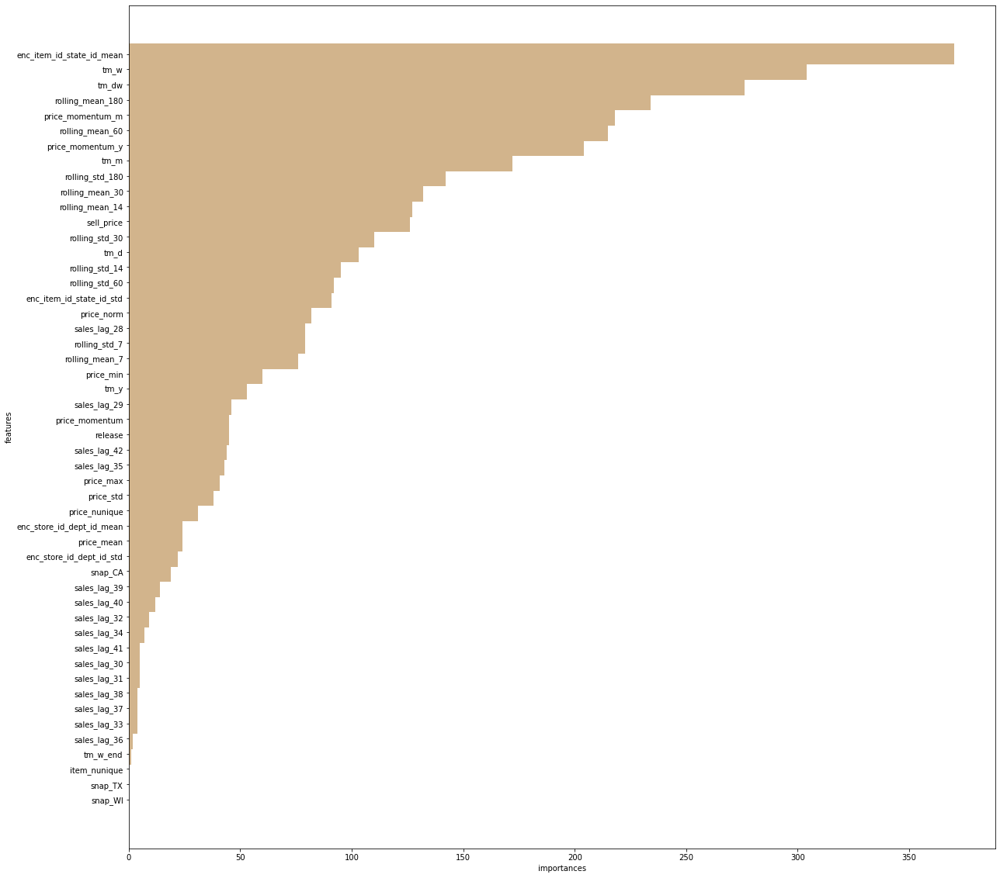

In [0]:
import pandas as pd
import matplotlib.pyplot as plt

feature_importances = model.getFeatureImportances()
fi = pd.Series(feature_importances[len(feature_importances)-50:], index=assemblerInputs[7:])
fi = fi.sort_values(ascending = True)
f_index = fi.index
f_values = fi.values
 
# print feature importances 
print ('f_index:',f_index)
print ('f_values:',f_values)

# plot
x_index = list(range(len(fi)))
x_index = [x/len(fi) for x in x_index]
plt.rcParams['figure.figsize'] = (20,20)
plt.barh(x_index,f_values,height = 0.028 ,align="center",color = 'tan',tick_label=f_index)
plt.xlabel('importances')
plt.ylabel('features')
plt.show()

## Model Prediction

In [0]:
display(grid_df.withColumn("d_int", extract_d("d")).filter(F.col("d_int")>1885))

d,item_id,dept_id,cat_id,sales,release,sell_price,price_max,price_min,price_std,price_mean,price_norm,price_nunique,item_nunique,price_momentum,price_momentum_m,price_momentum_y,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,tm_d,tm_w,tm_m,tm_y,tm_dw,tm_w_end,sales_lag_28,sales_lag_29,sales_lag_30,sales_lag_31,sales_lag_32,sales_lag_33,sales_lag_34,sales_lag_35,sales_lag_36,sales_lag_37,sales_lag_38,sales_lag_39,sales_lag_40,sales_lag_41,sales_lag_42,rolling_mean_7,rolling_std_7,rolling_mean_14,rolling_std_14,rolling_mean_30,rolling_std_30,rolling_mean_60,rolling_std_60,rolling_mean_180,rolling_std_180,enc_store_id_dept_id_mean,enc_store_id_dept_id_std,enc_item_id_state_id_mean,enc_item_id_state_id_std,d_int
d_1887,FOODS_1_001,FOODS_1,FOODS,1.0,11101,2.24,2.24,2.0,0.10957187969487552,2.16936170212766,1.0,2,1,1.0,1.0370370370370365,0.9999999999999994,NA,NA,NA,NA,0,0,0,29,13,3,6,3,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,1.0,0.0,1.0,0.0,0.142822265625,0.3779296875,0.428466796875,0.64599609375,0.7001953125,0.91552734375,0.60009765625,0.86767578125,0.59423828125,0.984375,1.6135924481978654,3.224883776662802,0.7856769472033456,1.258055123058382,1887
d_1893,FOODS_1_001,FOODS_1,FOODS,4.0,11101,2.24,2.24,2.0,0.10957187969487552,2.16936170212766,1.0,2,1,1.0,1.0385164051355202,0.9999999999999994,NA,NA,NA,NA,1,0,0,4,14,4,6,2,0,0.0,0.0,2.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.428466796875,0.78662109375,0.357177734375,0.63330078125,0.533203125,0.77587890625,0.63330078125,0.88232421875,0.611328125,0.98828125,1.6135924481978654,3.224883776662802,0.7856769472033456,1.258055123058382,1893
d_1906,FOODS_1_001,FOODS_1,FOODS,0.0,11101,2.24,2.24,2.0,0.10957187969487552,2.16936170212766,1.0,2,1,1.0,1.0385164051355202,0.9999999999999994,NA,NA,NA,NA,0,0,0,17,15,4,6,1,0,2.0,2.0,1.0,2.0,0.0,0.0,3.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.4287109375,1.1337890625,1.0,0.9609375,0.7001953125,0.876953125,0.7666015625,0.89013671875,0.68896484375,1.009765625,1.6135924481978654,3.224883776662802,0.7856769472033456,1.258055123058382,1906
d_1910,FOODS_1_001,FOODS_1,FOODS,0.0,11101,2.24,2.24,2.0,0.10957187969487552,2.16936170212766,1.0,2,1,1.0,1.0385164051355202,0.9999999999999994,NA,NA,NA,NA,0,0,0,21,16,4,6,5,1,0.0,2.0,2.0,0.0,2.0,2.0,1.0,2.0,0.0,0.0,3.0,1.0,1.0,1.0,1.0,1.2861328125,0.951171875,1.2138671875,0.97509765625,0.7333984375,0.9072265625,0.81689453125,0.9111328125,0.6943359375,1.0146484375,1.6135924481978654,3.224883776662802,0.7856769472033456,1.258055123058382,1910
d_1896,FOODS_1_002,FOODS_1,FOODS,0.0,11101,9.48,9.48,7.88,0.4860669436127623,8.937446808510641,1.0,3,1,1.0,1.0657212037357322,1.0000000000000004,NA,NA,NA,NA,1,1,0,7,14,4,6,5,1,0.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.428466796875,0.78662109375,0.28564453125,0.611328125,0.333251953125,0.7109375,0.36669921875,0.82275390625,0.38330078125,0.76416015625,1.6135924481978654,3.224883776662802,0.4777835859905907,0.8037912916847134,1896
d_1904,FOODS_1_002,FOODS_1,FOODS,1.0,11101,9.48,9.48,7.88,0.4860669436127623,8.937446808510641,1.0,3,1,1.0,1.0657212037357322,1.0000000000000004,NA,NA,NA,NA,0,1,1,15,15,4,6,6,1,2.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,0.85693359375,0.68994140625,0.64306640625,0.7451171875,0.333251953125,0.6064453125,0.416748046875,0.82958984375,0.4111328125,0.775390625,1.6135924481978654,3.224883776662802,0.4777835859905907,0.8037912916847134,1904
d_1909,FOODS_1_002,FOODS_1,FOODS,1.0,11101,9.48,9.48,7.88,0.4860669436127623,8.937446808510641,1.0,3,1,1.0,1.0657212037357322,1.0000000000000004,NA,NA,NA,NA,0,0,0,20,16,4,6,4,0,0.0,1.0,0.0,1.0,1.0,2.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.85693359375,0.68994140625,0.64306640625,0.63330078125,0.433349609375,0.6259765625,0.466552734375,0.8330078125,0.388916015625,0.7353515625,1.6135924481978654,3.224883776662802,0.4777835859905907,0.8037912916847134,1909
d_1912,FOODS_1_003,FOODS_1,FOODS,1.0,11101,3.23,3.23,2.88,0.15683851272317892,2.9768085106382975,1.0,2,1,1.0,1.0

In [0]:
scoredData = model.transform(test_df)
display(scoredData)

label,features,prediction
1.0,"Map(vectorType -> sparse, length -> 3139, indices -> List(11, 3047, 3048, 3050, 3080, 3084, 3087, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3104, 3105, 3106, 3107, 3108, 3111, 3117, 3120, 3121, 3123, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 11101.0, 2.24, 2.24, 2.0, 0.10957187969487552, 2.16936170212766, 1.0, 2.0, 1.0, 1.0, 1.0370370370370365, 0.9999999999999994, 29.0, 13.0, 3.0, 6.0, 3.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.142822265625, 0.3779296875, 0.428466796875, 0.64599609375, 0.7001953125, 0.91552734375, 0.60009765625, 0.86767578125, 0.59423828125, 0.984375, 1.6135924481978654, 3.224883776662802, 0.7856769472033456, 1.258055123058382))",0.6454573461360668
4.0,"Map(vectorType -> sparse, length -> 3139, indices -> List(11, 3047, 3048, 3050, 3080, 3084, 3087, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3104, 3105, 3106, 3107, 3108, 3112, 3115, 3117, 3123, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 11101.0, 2.24, 2.24, 2.0, 0.10957187969487552, 2.16936170212766, 1.0, 2.0, 1.0, 1.0, 1.0385164051355202, 0.9999999999999994, 1.0, 4.0, 14.0, 4.0, 6.0, 2.0, 2.0, 1.0, 1.0, 1.0, 0.428466796875, 0.78662109375, 0.357177734375, 0.63330078125, 0.533203125, 0.77587890625, 0.63330078125, 0.88232421875, 0.611328125, 0.98828125, 1.6135924481978654, 3.224883776662802, 0.7856769472033456, 1.258055123058382))",0.6956274944719919
0.0,"Map(vectorType -> sparse, length -> 3139, indices -> List(12, 3047, 3048, 3050, 3080, 3084, 3087, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3101, 3102, 3104, 3105, 3106, 3107, 3108, 3109, 3111, 3115, 3120, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 11101.0, 9.48, 9.48, 7.88, 0.4860669436127623, 8.937446808510641, 1.0, 3.0, 1.0, 1.0, 1.0657212037357322, 1.0000000000000004, 1.0, 1.0, 7.0, 14.0, 4.0, 6.0, 5.0, 1.0, 1.0, 2.0, 1.0, 0.428466796875, 0.78662109375, 0.28564453125, 0.611328125, 0.333251953125, 0.7109375, 0.36669921875, 0.82275390625, 0.38330078125, 0.76416015625, 1.6135924481978654, 3.224883776662802, 0.4777835859905907, 0.8037912916847134))",0.38608534923604376
1.0,"Map(vectorType -> sparse, length -> 3139, indices -> List(12, 3047, 3048, 3050, 3080, 3084, 3087, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3102, 3103, 3104, 3105, 3106, 3107, 3108, 3109, 3110, 3111, 3112, 3113, 3115, 3119, 3123, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 11101.0, 9.48, 9.48, 7.88, 0.4860669436127623, 8.937446808510641, 1.0, 3.0, 1.0, 1.0, 1.0657212037357322, 1.0000000000000004, 1.0, 1.0, 15.0, 15.0, 4.0, 6.0, 6.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 0.85693359375, 0.68994140625, 0.64306640625, 0.7451171875, 0.333251953125, 0.6064453125, 0.416748046875, 0.82958984375, 0.4111328125, 0.775390625, 1.6135924481978654, 3.224883776662802, 0.4777835859905907, 0.8037912916847134))",0.5139730921271398
0.0,"Map(vectorType -> sparse, length -> 3139, indices -> List(14, 3047, 3048, 3050, 3080, 3084, 3087, 3089, 3090, 3091, 3092, 3093, 3094, 3095, 3096, 3097, 3098, 3099, 3100, 3104, 3105, 3106, 3107, 3108, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 3137, 3138), values -> List(1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 11206.0, 1.96, 1.96, 1.5, 0.10326095775667292, 1.851377777777778, 1.0, 3.0, 1.0, 1.0, 1.063709296838131, 0.9999999999999997, 28.0, 13.0, 3.0, 6.0, 2.0, 2.6328125, 6.2109375, 4.33203125, 6.2734375, 5.02734375, 6.01171875, 1.6135924481978654, 3.224883776662802, 10.433949801849405, 8.753203359626703))",1.2979562097919115
0.0,"Map(vectorType -> sparse, length -> 3139, indices -> List(14, 3047, 3048, 3050, 3080, 3084, 3087,

In [0]:
from synapse.ml.train import ComputeModelStatistics
metrics = ComputeModelStatistics(evaluationMetric='regression',
                                 labelCol='label',
                                 scoresCol='prediction') \
            .transform(scoredData)
display(metrics)

mean_squared_error,root_mean_squared_error,R^2,mean_absolute_error
4.63093889879895,2.1519616397136243,0.6180002124612902,1.1004847296429008


In [0]:
from synapse.ml.train import ComputeModelStatistics
metrics = ComputeModelStatistics(evaluationMetric='regression',
                                 labelCol='label',
                                 scoresCol='prediction') \
            .transform(scoredData)
display(metrics)

mean_squared_error,root_mean_squared_error,R^2,mean_absolute_error
3.6614531080369668,1.913492385152595,0.7420603581150937,1.0052474472643171
